<a href="https://colab.research.google.com/github/ruas-pedro/analisem_ols_ipca_R/blob/main/machine_learning_casas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install pydantic
!pip install pydantic-settings
!pip install ydata-profiling


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 30.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 77.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=a770158556633b0832c7870dd54ee634649aaeff3dca8a738a938aee01b47780
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [3]:
import pandas as pd
from ydata_profiling import ProfileReport
from google.colab import files
import matplotlib.pyplot as plt
import seaborn as sns

pd.options.display.float_format = '{:,.2f}'.format
%matplotlib inline

In [4]:
uploaded = files.upload()

Saving melb_data.csv to melb_data.csv


In [5]:
base = pd.read_csv("melb_data.csv")

In [ ]:
base

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,"1,480,000.00",S,Biggin,3/12/2016,2.50,"3,067.00",...,1.00,1.00,202.00,NaN,NaN,Yarra,-37.80,145.00,Northern Metropolitan,"4,019.00"
1,Abbotsford,25 Bloomburg St,2,h,"1,035,000.00",S,Biggin,4/02/2016,2.50,"3,067.00",...,1.00,0.00,156.00,79.00,"1,900.00",Yarra,-37.81,144.99,Northern Metropolitan,"4,019.00"
2,Abbotsford,5 Charles St,3,h,"1,465,000.00",SP,Biggin,4/03/2017,2.50,"3,067.00",...,2.00,0.00,134.00,150.00,"1,900.00",Yarra,-37.81,144.99,Northern Metropolitan,"4,019.00"
3,Abbotsford,40 Federation La,3,h,"850,000.00",PI,Biggin,4/03/2017,2.50,"3,067.00",...,2.00,1.00,94.00,NaN,NaN,Yarra,-37.80,145.00,Northern Metropolitan,"4,019.00"
4,Abbotsford,55a Park St,4,h,"1,600,000.00",VB,Nelson,4/06/2016,2.50,"3,067.00",...,1.00,2.00,120.00,142.00,"2,014.00",Yarra,-37.81,144.99,Northern Metropolitan,"4,019.00"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13575,Wheelers Hill,12 Strada Cr,4,h,"1,245,000.00",S,Barry,26/08/2017,16.70,"3,150.00",...,2.00,2.00,652.00,NaN,"1,981.00",NaN,-37.91,145.17,South-Eastern Metropolitan,"7,392.00"
13576,Williamstown,77 Merrett Dr,3,h,"1,031,000.00",SP,Williams,26/08/2017,6.80,"3,016.00",...,2.00,2.00,333.00,133.00,"1,995.00",NaN,-37.86,144.88,Western Metropolitan,"6,380.00"
13577,Williamstown,83 Power St,3,h,"1,170,000.00",S,Raine,26/08/2017,6.80,"3,016.00",...,2.00,4.00,436.00,NaN,"1,997.00",NaN,-37.85,144.89,Western Metropolitan,"6,380.00"
13578,Williamstown,96 Verdon St,4,h,"2,500,000.00",PI,Sweeney,26/08/2017,6.80,"3,016.00",...,1.00,5.00,866.00,157.00,"1,920.00",NaN,-37.86,144.89,Western Metropolitan,"6,380.00"


In [6]:
profile = ProfileReport(base)

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
base_num = base.drop(["CouncilArea", "Regionname", "Date", "Suburb", "Address", "Type", "Method", "SellerG"], axis=1)

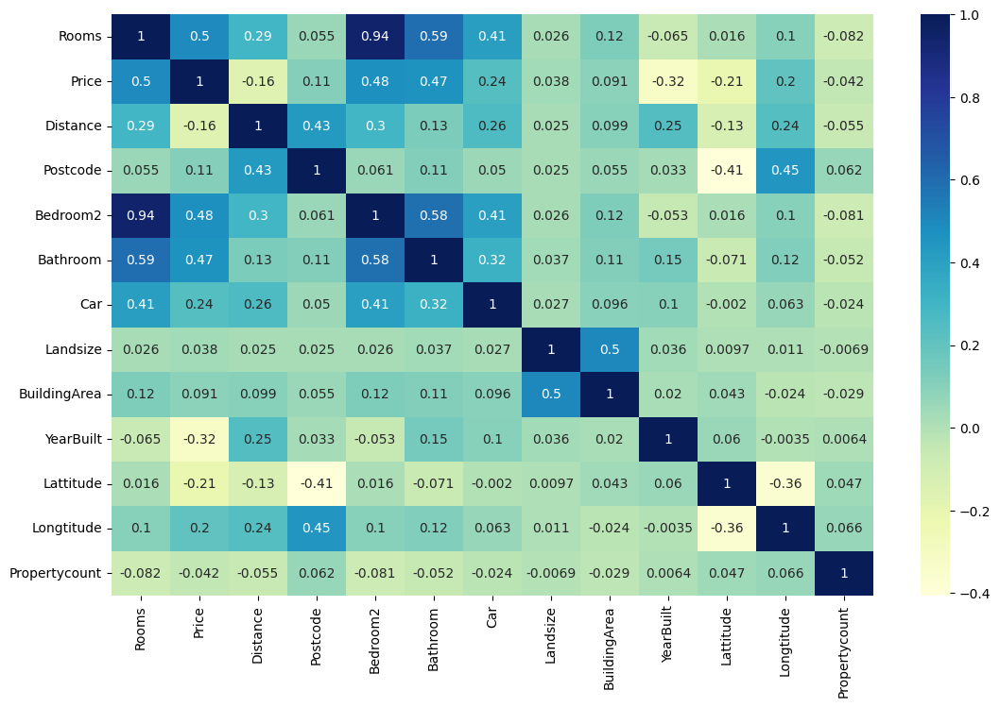

In [8]:
# utilizando seaborn para mostrar a correlação entre as variáveis

plt.figure(figsize=(13, 8))
sns.heatmap(base_num.corr(), annot=True, cmap="YlGnBu")
plt.show()

In [9]:
# retirando colunas com alta cardinalidade (evita overfitting)

base = base.drop(['Address', 'Date', 'Suburb', 'SellerG'], axis=1)

In [10]:
# Retirando colunas com mais de 20% de valores nulos

base = base.drop(["BuildingArea", "YearBuilt"], axis=1)


In [11]:
base.head()

,Rooms,Type,Price,Method,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,2,h,"1,480,000.00",S,2.50,"3,067.00",2.00,1.00,1.00,202.00,Yarra,-37.80,145.00,Northern Metropolitan,"4,019.00"
1,2,h,"1,035,000.00",S,2.50,"3,067.00",2.00,1.00,0.00,156.00,Yarra,-37.81,144.99,Northern Metropolitan,"4,019.00"
2,3,h,"1,465,000.00",SP,2.50,"3,067.00",3.00,2.00,0.00,134.00,Yarra,-37.81,144.99,Northern Metropolitan,"4,019.00"
3,3,h,"850,000.00",PI,2.50,"3,067.00",3.00,2.00,1.00,94.00,Yarra,-37.80,145.00,Northern Metropolitan,"4,019.00"
4,4,h,"1,600,000.00",VB,2.50,"3,067.00",3.00,1.00,2.00,120.00,Yarra,-37.81,144.99,Northern Metropolitan,"4,019.00"


In [12]:
# Selecionando variáveis com maior correlação

base1 = base[["Price", "Rooms", "Bathroom", "Bedroom2", "Car", "Landsize"]]

In [13]:
base1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Price     13580 non-null  float64
 1   Rooms     13580 non-null  int64  
 2   Bathroom  13580 non-null  float64
 3   Bedroom2  13580 non-null  float64
 4   Car       13518 non-null  float64
 5   Landsize  13580 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 636.7 KB


In [14]:
# A variável "car" tem linhas com elementos nulos. Assim usaremos dropna para apagar essas linhas. Como a base é grande não será um problema
# axis = 0 indica que é para remover as linhas, se fosse axis=1 removeria as colunas

base1 = base1.dropna(axis=0)

In [15]:
base1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13518 entries, 0 to 13579
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Price     13518 non-null  float64
 1   Rooms     13518 non-null  int64  
 2   Bathroom  13518 non-null  float64
 3   Bedroom2  13518 non-null  float64
 4   Car       13518 non-null  float64
 5   Landsize  13518 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 739.3 KB


In [16]:
base1

,Price,Rooms,Bathroom,Bedroom2,Car,Landsize
0,"1,480,000.00",2,1.00,2.00,1.00,202.00
1,"1,035,000.00",2,1.00,2.00,0.00,156.00
2,"1,465,000.00",3,2.00,3.00,0.00,134.00
3,"850,000.00",3,2.00,3.00,1.00,94.00
4,"1,600,000.00",4,1.00,3.00,2.00,120.00
...,...,...,...,...,...,...
13575,"1,245,000.00",4,2.00,4.00,2.00,652.00
13576,"1,031,000.00",3,2.00,3.00,2.00,333.00
13577,"1,170,000.00",3,2.00,3.00,4.00,436.00
13578,"2,500,000.00",4,1.00,4.00,5.00,866.00


# Criando o modelo de machine learning


In [17]:
# O primeiro passo é separar a variável explicada/ endógena das explicativas/ exógenas

Y = base1[['Price']]

X = base1.drop("Price", axis=1)

In [18]:
X

,Rooms,Bathroom,Bedroom2,Car,Landsize
0,2,1.00,2.00,1.00,202.00
1,2,1.00,2.00,0.00,156.00
2,3,2.00,3.00,0.00,134.00
3,3,2.00,3.00,1.00,94.00
4,4,1.00,3.00,2.00,120.00
...,...,...,...,...,...
13575,4,2.00,4.00,2.00,652.00
13576,3,2.00,3.00,2.00,333.00
13577,3,2.00,3.00,4.00,436.00
13578,4,1.00,4.00,5.00,866.00


In [19]:
# O segundo passo é separar as variáveis de treino e de teste

from sklearn.model_selection import train_test_split
X_treino, X_teste, Y_treino, Y_teste = train_test_split(X, Y)

In [20]:
X_treino.head()

,Rooms,Bathroom,Bedroom2,Car,Landsize
5058,3,2.00,3.00,1.00,267.00
3248,2,1.00,2.00,2.00,281.00
8712,3,1.00,3.00,1.00,160.00
9721,1,1.00,1.00,1.00,0.00
4706,2,2.00,2.00,2.00,"21,700.00"


# Testando modelos de previsão

#### Regressão Linear

In [22]:
# Importando modelo
from sklearn import linear_model

modelo_regressao = linear_model.LinearRegression()



In [23]:
# Fazendo fit do modelo

modelo_regressao.fit(X_treino, Y_treino)



LinearRegression()

In [24]:
# Usando o modelo para prever os dados usando a função "predict"

y_regressao = modelo_regressao.predict(X_teste)

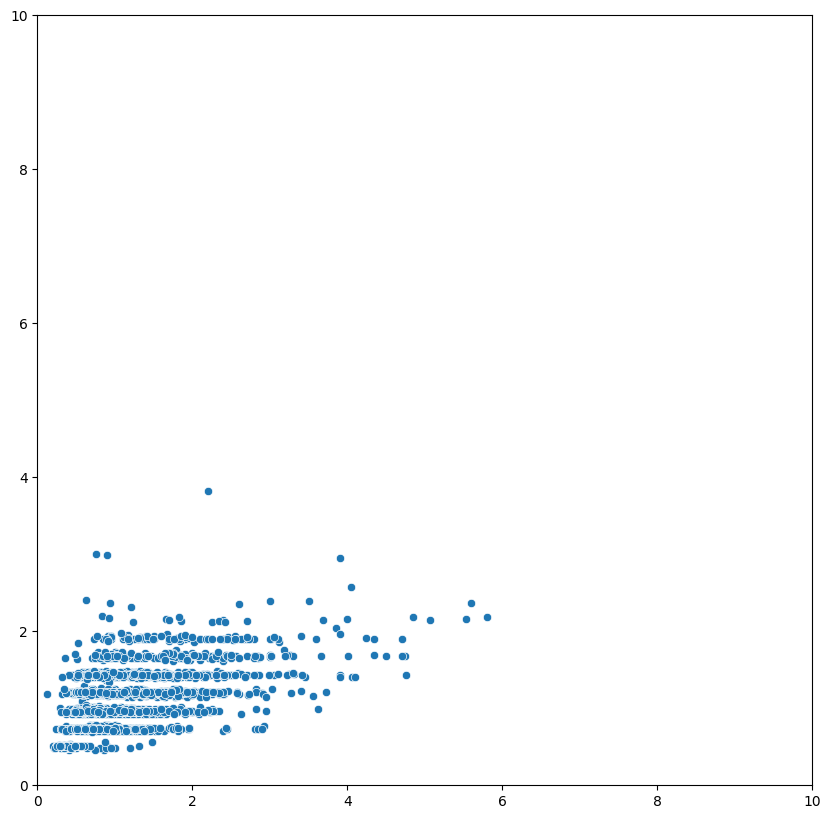

In [25]:
# Podemos visualizar os pontos previstos X real

plt.figure(figsize=(10, 10))

sns.scatterplot(x=Y_teste.values.flatten()/1000000, y=y_regressao.flatten()/1000000)

plt.ylim(0,10)
plt.xlim(0,10)
plt.show()

Como as observações não estão concentradas na diagonal, isso é um indicativo de que há um erro de previsão. Para entender melhor esse errovamos observar outros dados dessa regressão.


In [27]:
# Avaliando erro quadrático médio

from sklearn.metrics import mean_squared_error

erro_quadratico_regressao = mean_squared_error(Y_teste, y_regressao)

print(erro_quadratico_regressao)

276551158856.7506


In [28]:
# Avaliando R quadrado

from sklearn.metrics import r2_score

r2_regressao = r2_score(Y_teste, y_regressao)

print(r2_regressao)

0.30257009991397776


# Regressão linear com outras colunas

In [30]:
#

base2 = base[["Price", "Rooms", "Bathroom", "Bedroom2", "Car", "Longtitude", "Lattitude" ,"Distance", "Landsize", "Postcode", "Propertycount"]]

In [31]:
# Verificando vetores nulos e tratando

base2 = base2.dropna(axis=0)

base2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13518 entries, 0 to 13579
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Price          13518 non-null  float64
 1   Rooms          13518 non-null  int64  
 2   Bathroom       13518 non-null  float64
 3   Bedroom2       13518 non-null  float64
 4   Car            13518 non-null  float64
 5   Longtitude     13518 non-null  float64
 6   Lattitude      13518 non-null  float64
 7   Distance       13518 non-null  float64
 8   Landsize       13518 non-null  float64
 9   Postcode       13518 non-null  float64
 10  Propertycount  13518 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 1.2 MB


In [32]:
# Separando a base

Y = base2[['Price']]

X = base2.drop("Price", axis=1)

In [33]:
# Dividindo em treino e teste

from sklearn.model_selection import train_test_split
X_treino, X_teste, Y_treino, Y_teste = train_test_split(X, Y)

In [34]:
# Fazendo o fit dos dados

modelo_regressao2 = linear_model.LinearRegression()

modelo_regressao2.fit(X_treino, Y_treino)

LinearRegression()

In [35]:
# Usando modelo para prever os dados

y_regressao2 = modelo_regressao2.predict(X_teste)



In [37]:
# Avalaiando os erros
# erro quadrático médio

erro_quadratico_regressao2 = mean_squared_error(Y_teste, y_regressao2)

print(erro_quadratico_regressao2)

222182413927.86652


In [36]:
# Avaliando o R quadrado

r2_regressao2 = r2_score(Y_teste, y_regressao2)

print(r2_regressao2)

0.4854885476543235


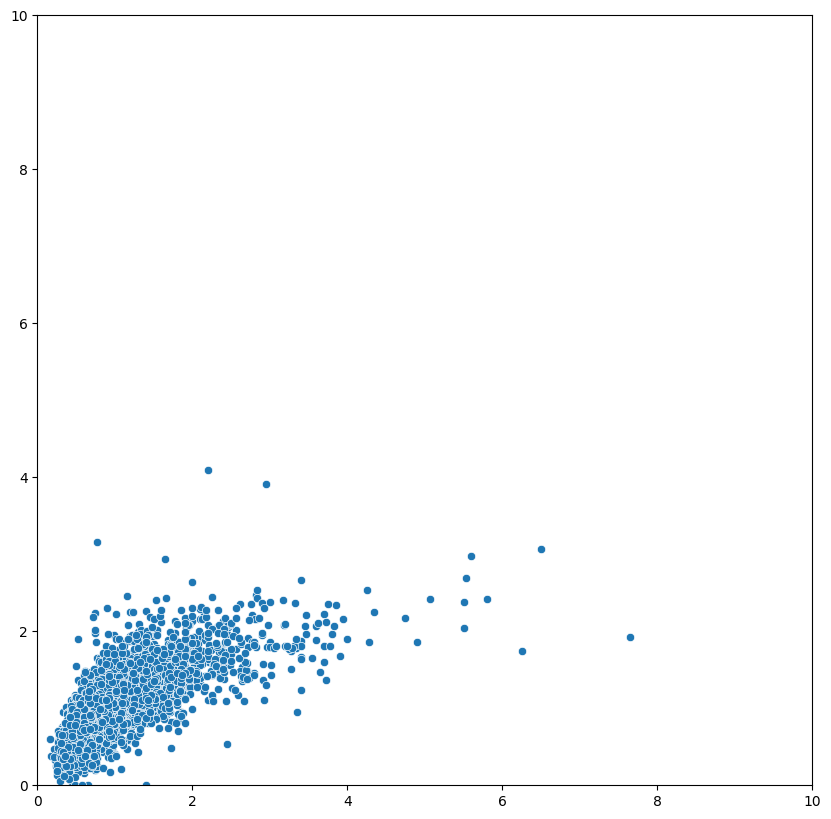

In [39]:
# Podemos visualizar os pontos previstos X real

plt.figure(figsize=(10, 10))

sns.scatterplot(x=Y_teste.values.flatten()/1000000, y=y_regressao2.flatten()/1000000)   #y_regressao2 são os dados previstos

plt.ylim(0,10)
plt.xlim(0,10)
plt.show()

Podemos ver que esse modelo além de ter o R quadrado maior,o que pode indicar maior poder explicativo, e erro quadrático menor, no gráfico os elementos tbm estão mais na vertical, indicanco que os dados do eixo x que são os dados reais usados para teste, estão mais próximos dos dados do eixo y, que são ods dados previstos na regressão

# Árvore de decisão

Outro modelo de machine learning

In [40]:
# importando o modelo

from sklearn.tree import DecisionTreeRegressor

# Instanciando

modelo_arvore_decisao = DecisionTreeRegressor()

# Fazendo fit

modelo_arvore_decisao.fit(X_treino, Y_treino)

DecisionTreeRegressor()

In [42]:
# usando o modelo para prever dados de teste

y_arvore_decisao = modelo_arvore_decisao.predict(X_teste) # ele vai prever o y a partir dos dados x para teste

In [43]:
# Avaliando os erros

#erro quadrático médio

erro_quadratico_arvore_decisao = mean_squared_error(Y_teste, y_arvore_decisao) # compara o y real usado para testar a previsão (Y_teste) com
                                                                               # o y previsto (y_arvore_decisao)

print(erro_quadratico_arvore_decisao)

202575763605.9352


In [44]:
# R quadrado

r2_arvore_de_decisao = r2_score(Y_teste, y_arvore_decisao)

print(r2_arvore_de_decisao)


0.5308919887027488


Pelos dados o modelo de árvore de decisão tem um melhor capacidade de prever os dados

# Fazendo um resumo dos resultados

In [47]:
print('Regressão Linear')
print('Erro quadrático médio: ' + str(round(erro_quadratico_regressao,2)))
print('R quadrado: ' + str(round(r2_regressao,4)))
print('------------------------------------------')
print('Regressão Linear com outras colunas')
print('Erro quadrático médio: ' + str(round(erro_quadratico_regressao2,2)))
print('R quadrado: ' + str(round(r2_regressao2,4)))
print('------------------------------------------')
print('Árvore de decisão')
print('Erro quadrático médio: ' + str(round(erro_quadratico_arvore_decisao,2)))
print('R quadrado: ' + str(round(r2_arvore_de_decisao,4)))

Regressão Linear
Erro quadrático médio: 276551158856.75
R quadrado: 0.3026
------------------------------------------
Regressão Linear com outras colunas
Erro quadrático médio: 222182413927.87
R quadrado: 0.4855
------------------------------------------
Árvore de decisão
Erro quadrático médio: 202575763605.94
R quadrado: 0.5309
